<a href="https://colab.research.google.com/github/jmestanza/time_stretching/blob/master/refactor.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
%cd /content
from IPython.display import clear_output

#imports
#!pip install librosa
!pip install webrtcvad
import webrtcvad
!pip install --upgrade librosa
import librosa 
import scipy
import numpy as np
from IPython.display import Audio
import matplotlib.pyplot as plt
from math import ceil 
import matplotlib.patches as mpatches

clear_output()

In [0]:
#local modules
!wget https://raw.githubusercontent.com/jmestanza/time_stretching/master/code/detect_pitch.py
#!wget https://raw.githubusercontent.com/jmestanza/time_stretching/master/code/modified_psola.py
!wget https://raw.githubusercontent.com/jmestanza/time_stretching/master/code/vad.py

#audios
!wget "https://raw.githubusercontent.com/vicaub/Pitch-Estimation-and-Voicing-Detection/master/data/fda_ue/rl047.wav"
!wget "https://raw.githubusercontent.com/jmestanza/time_stretching/master/code/input/harry_potter_es.wav"
!wget "https://raw.githubusercontent.com/jmestanza/time_stretching/master/code/input/hunger_games_en.wav"
!wget "https://raw.githubusercontent.com/jmestanza/time_stretching/master/code/input/shh.wav"

clear_output()

In [0]:
from modified_psola import modified_psola
from detect_pitch import get_fundamental_frequency
from vad import float2pcm, pcm2float, frame_generator, join_vad_frames, get_vad_frames
from vad import Frame
from scipy import signal

clear_output()

## Escuchamos el input

In [4]:
fs = 48000

audio = "/content/hunger_games_en.wav"
Audio(data=audio, rate=fs)

In [0]:
def plot_voiced_regs(regions, is_frame_speech, audio_f):
  plt.figure(figsize=(20, 5))
  green_patch = mpatches.Patch(color='green', label='sonoro')
  red_patch = mpatches.Patch(color='red', label='no-sonoro')
  plt.legend(handles=[green_patch, red_patch])
  plt.xlabel("muestras")
  plt.ylabel("amplitud")

  #ploteo regiones sonoras y no sonoras
  for i,reg in enumerate(regions):
    start,end = reg  
    if start < 1000000 and end < 1000000:
      if(is_frame_speech[start] == True):
        # plt.vlines(x=start, ymin=0, ymax=1.0)
        plt.hlines(y=0.65, xmin=start, xmax=end, linewidth=3, colors='g')
        # plt.vlines(x=end, ymin=0, ymax=1.0)
      else:
        plt.hlines(y=0.65, xmin=start, xmax=end, linewidth=3, colors='r')

    
  plt.plot(audio_f[:1000000])
  plt.grid()
  plt.figure()

# REGIONS BUGGEADO CON EL CUAL DABA BUENOS RESULTADOS
# def separate_regions(is_voiced):
#     regions = []
#     for i in range(len(is_voiced)):
#         if i == len(is_voiced) - 1:
#             regions.append([start,i])
#         elif i ==0:
#             start = 0
#     else:
#         curr_region = is_voiced[i] # si es sonoro o no sonoro
#         if curr_region != is_voiced[i-1]:
#             regions.append([start,i-1]) # pusheo la region anterior
#         start = i
#     return regions
def separate_regions(is_voiced):
    regions = []
    for i in range(len(is_voiced)):
        curr = is_voiced[i]
        if i == 0: 
            start = 0
            last = is_voiced[i] # asigno last como en el que estoy
            # si son iguales, no se hace nada y se prosigue
        else:
            last = is_voiced[i-1]
            if curr != last: # si cambio algo, pongo nuevo start
                regions.append([start,i-1])
                start = i  
            # suponiendo q ya flusheo el ultimo arreglo,
            # ya sea inmediato anterior el ultimo pedazo de arreglo
            # o antes...
            if i == len(is_voiced) - 1:
                regions.append([start,i]) 
                # esto funciona si no cambio, last != curr, tengo guardado start
                # y si cambio tambien [start= i, i]

        #print("curr",curr,"last",last, "es distinto", curr!=last, "start", start)
    return regions

def get_float_and_int_audio(audio_path,fs, cut_audio = None):
    audio_f, _ = librosa.load(audio_path, sr=fs, mono=True)
    audio_i = float2pcm(audio_f, dtype="int32")
    if cut_audio != None:
        audio_f = audio_f[:int(cut_audio*fs)]
        audio_i = audio_i[:int(cut_audio*fs)]
    return audio_f, audio_i

def lpc_filtering(regions, audio_f, coef_number):
    lpc_coeffs = []
    error = []
    for start, end in regions:
        a = librosa.lpc(audio_f[start:end], coef_number)
        lpc_coeffs.append(a)
        error.extend(scipy.signal.lfilter(a, [1], audio_f[start:end]))
    error = np.array(error)
    return error, lpc_coeffs

def vad_config(audio_i, fs):
    vad = webrtcvad.Vad(3)    #0 is the least aggressive about filtering out non-speech, 3 is the most aggressive; 3 pone mas frames en no-sonoros
    #divido el audio en frames de 20 milisegundos
    frames = list(frame_generator(20, audio_i, fs))
    speech, not_speech, is_frame_speech, frame_len = get_vad_frames(frames, vad, fs)
    return speech, not_speech, is_frame_speech, frame_len

def get_regions_in_new_time(regions,speed): 
    sub_regions = []
    for i,reg in enumerate(regions):
        start,end = reg
        if i == 0: # si es el primero, inicia en 0, 
            new_start = 0
        else:  # sino empieza en el anterior final + 1
            new_start = last_end + 1
        new_end = ceil(end*(1/speed))

        sub_regions.append([new_start,new_end])
        last_end = new_end
    return sub_regions

def process_error(error, K, L, fs,percent,speed,is_voiced,regions):
    f0_idx,f0 = get_fundamental_frequency(error,is_voiced, K, L, fs)
    psola_error, pitch_zones, unvoiced_zones = modified_psola(error, f0_idx, f0,percent, speed, is_voiced, regions)
                            #(    x, f0_idx, f0, percent, speed, is_voiced, regions, unvoiced_samples=360):

    return psola_error, f0_idx, f0 , pitch_zones, unvoiced_zones

def get_noise_for_lpc(audio_f,std = 0.001):
    noise = np.random.normal(0, std, size=len(audio_f)) # media 0
    #plt.plot(samples)
    return noise+audio_f 

def get_K_and_L(T,fs):
    samples = int(T * fs) 
    L = samples//2
    K = L
    print("periodicidad minima que se puede estimar",fs/K, "Hz")
    return K, L 

def plot_four_signals(audio_original,audio_procesado,error_psola,is_voice, speed,normalize = False, fill_with_zeros= False):
    if normalize:
     audio_original = librosa.util.normalize(audio_original)
     audio_procesado = librosa.util.normalize(audio_procesado)
    if fill_with_zeros:
        if speed != 1.0:
            audio_procesado = np.hstack((audio_procesado,np.zeros(len(audio_original)-len(audio_procesado))))
            error_psola = np.hstack((error_psola,np.zeros(len(audio_original)-len(error_psola))))
            is_voice = np.hstack((is_voice,np.zeros(len(audio_original)-len(is_voice))))
            
    time = np.linspace(0, len(audio_original)//fs, len(audio_original))
    fig = plt.figure(figsize=(15,5))
    ax = fig.add_subplot(411)
    ax1 = fig.add_subplot(412)
    ax.set_title('Audio en inglés x{}'.format(speed))
    ax.plot(time, audio_original, 'b') 
    ax1.plot(time[:len(audio_procesado)],audio_procesado, 'g')
    ax1.set_xlabel("tiempo (s)")
    ax.set_ylabel("speed = 1.0")
    ax1.set_ylabel('speed = {}'.format(speed))

    ax2 = fig.add_subplot(413)
    ax2.set_xlabel("tiempo (s)")
    ax2.set_ylabel('error'.format(speed))
    ax2.plot(time[:len(error_psola)],error_psola, "r")

    ax3 = fig.add_subplot(414)
    ax3.set_xlabel("tiempo (s)")
    ax3.set_ylabel('unvoiced'.format(speed))
    ax3.plot(time[:len(is_voice)],is_voice, "y")
    
    plt.show()


In [0]:
# este SpeedUp agrega ruido a la senial para obtener LPC
# y despues filtra la senial + ruido,
# POSIBLES MEJORAS: 
# 1) se podria filtrar solo  la senial en vez de senial mas ruido pero quedarse
# de todas formas con los coeficientes lpc esos.
# 2) Aplicar ventanas de 20 ms para hacer LPC short time en vez de separar
# por regiones sonoras y no sonoras

def speed_up(audio_path, speed, sample_rate, T=20*1e-3, cut = None):
    audio_f, audio_i = get_float_and_int_audio(audio_path,fs, cut_audio = cut) # audio_i lo necesita el VAD
    audio_f = get_noise_for_lpc(audio_f, std=1e-4)
    
    K , L = get_K_and_L(T,fs)

    speech, not_speech, is_voiced, frame_len = vad_config(audio_i, fs)

    regions = separate_regions(is_voiced)
    print("regions:", regions)
    regions_lpc = regions.copy()
    error, lpc_coeffs = lpc_filtering(regions_lpc, audio_f, coef_number=12) 
    percent = 0.5

    psola_error, f0_idx, f0, pitch_zones, unvoiced_zones =  process_error(error, K, L, fs,percent,speed,is_voiced,regions)
    
    sub_regions = get_regions_in_new_time(regions_lpc,speed)

    voiced_filt = []            

    for i, sub_reg in enumerate(sub_regions):      
        start, end = sub_reg
        voiced_filt.extend(scipy.signal.lfilter([1], lpc_coeffs[i] , psola_error[start:end]))
    voiced_filt = np.array(voiced_filt)
    
    is_voiced = np.array(is_voiced)
    is_voiced = is_voiced.astype(np.int16)

    return voiced_filt, psola_error, error, audio_f, is_voiced, pitch_zones, unvoiced_zones



In [0]:
speed = 2.0
audio_final, psola_err, err, audio_original = speed_up(audio, speed, fs)
plot_three_signals(audio_original,audio_final,psola_err, speed,normalize = False, fill_with_zeros=False)
Audio(data=audio_final, rate=fs)

In [0]:
speed = 1.75
audio_final, psola_err, err, audio_original = speed_up(audio, speed, fs)
plot_three_signals(audio_original,audio_final,psola_err, speed,normalize = False, fill_with_zeros=False)
Audio(data=audio_final, rate=fs)

periodicidad minima que se puede estimar 100.0 Hz
regions: [[0, 1919], [1920, 13439], [13440, 49919], [49920, 124799], [124800, 142079]]
Estoy en psola
Estoy en un frame de no speech
Estoy en un frame de speech


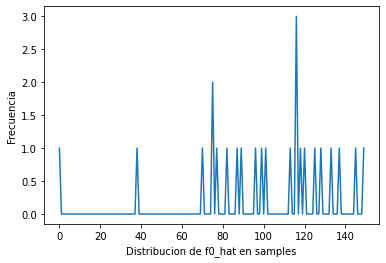

726
Hay  25 pitches 
entro a procesar los pitches
entro a procesar 1.25, 1.5 y 1.75
Zona  [554, 2006]
entro a procesar los pitches
entro a procesar 1.25, 1.5 y 1.75
Zona  [803, 2255]
entro a procesar los pitches
entro a procesar 1.25, 1.5 y 1.75
entro a procesar los pitches
entro a procesar 1.25, 1.5 y 1.75
Zona  [1602, 3054]
entro a procesar los pitches
entro a procesar 1.25, 1.5 y 1.75
Zona  [2068, 3520]
entro a procesar los pitches
entro a procesar 1.25, 1.5 y 1.75
entro a procesar los pitches
entro a procesar 1.25, 1.5 y 1.75
Zona  [2630, 4082]
entro a procesar los pitches
entro a procesar 1.25, 1.5 y 1.75
Zona  [3059, 4511]
entro a procesar los pitches
entro a procesar 1.25, 1.5 y 1.75
entro a procesar los pitches
entro a procesar 1.25, 1.5 y 1.75
Zona  [3642, 5094]
entro a procesar los pitches
entro a procesar 1.25, 1.5 y 1.75
Zona  [3911, 5363]
entro a procesar los pitches
entro a procesar 1.25, 1.5 y 1.75
entro a procesar los pitches
entro a procesar 1.25, 1.5 y 1.75
Zona  [456

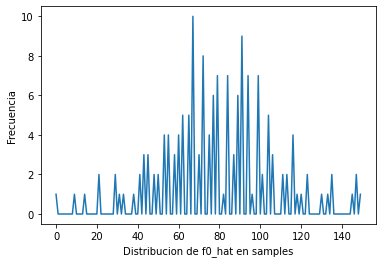

712
Hay  160 pitches 
entro a procesar los pitches
entro a procesar 1.25, 1.5 y 1.75
Zona  [32939, 34363]
entro a procesar los pitches
entro a procesar 1.25, 1.5 y 1.75
Zona  [33185, 34609]
entro a procesar los pitches
entro a procesar 1.25, 1.5 y 1.75
entro a procesar los pitches
entro a procesar 1.25, 1.5 y 1.75
Zona  [33780, 35204]
entro a procesar los pitches
entro a procesar 1.25, 1.5 y 1.75
Zona  [34091, 35515]
entro a procesar los pitches
entro a procesar 1.25, 1.5 y 1.75
entro a procesar los pitches
entro a procesar 1.25, 1.5 y 1.75
Zona  [34689, 36113]
entro a procesar los pitches
entro a procesar 1.25, 1.5 y 1.75
Zona  [35116, 36540]
entro a procesar los pitches
entro a procesar 1.25, 1.5 y 1.75
entro a procesar los pitches
entro a procesar 1.25, 1.5 y 1.75
Zona  [35887, 37311]
entro a procesar los pitches
entro a procesar 1.25, 1.5 y 1.75
Zona  [36193, 37617]
entro a procesar los pitches
entro a procesar 1.25, 1.5 y 1.75
entro a procesar los pitches
entro a procesar 1.25, 1.

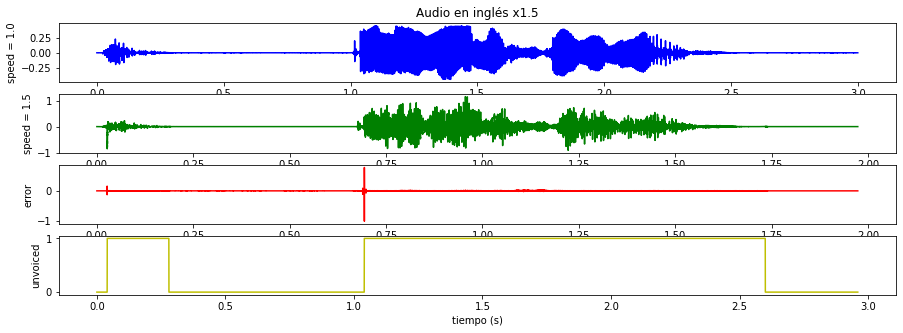

In [37]:
speed = 1.5
audio_final, psola_err, err, audio_original, is_voice, pz, uz = speed_up(audio, speed, fs, cut = 3) # hacemos los primeros 10 segundos
plot_four_signals(audio_original,audio_final,psola_err,is_voice,speed,normalize = False, fill_with_zeros=False)
Audio(data=audio_final, rate=fs)

In [8]:
print(pz)

[]


In [15]:
len(is_voice)

142080

In [16]:
len(audio_original)

144000

[[120, 840], [480, 1200], [840, 1560], [1200, 1920], [1560, 2280], [1920, 2640], [2280, 3000], [2640, 3360], [3000, 3720], [3360, 4080], [3720, 4440], [4080, 4800], [4440, 5160], [4800, 5520], [5160, 5880], [5520, 6240], [5880, 6600], [6240, 6960], [6600, 7320], [6960, 7680], [7320, 8040], [7680, 8400], [8040, 8760], [8400, 9120], [8760, 9480], [9120, 9840], [9480, 10200], [9840, 10560], [10200, 10920], [10560, 11280], [10920, 11640], [11280, 12000], [11640, 12360], [12000, 12720], [12360, 13080], [12720, 13440], [13080, 13800], [13440, 14160], [13800, 14520], [14160, 14880], [14520, 15240], [14880, 15600], [15240, 15960], [15600, 16320], [15960, 16680], [16320, 17040], [16680, 17400], [17040, 17760], [17400, 18120], [17760, 18480], [18120, 18840], [18480, 19200], [18840, 19560], [19200, 19920], [19560, 20280], [19920, 20640], [20280, 21000], [20640, 21360], [21000, 21720], [21360, 22080], [21720, 22440], [22080, 22800], [22440, 23160], [22800, 23520], [23160, 23880], [23520, 24240], [

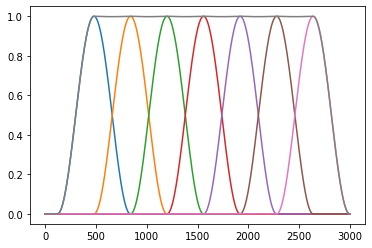

In [38]:

#time = np.linspace(0, len(audio_final)//fs, len(audio_original))
time = np.linspace(0, len(audio_final)//fs, 3000)

print(uz)
suma = np.zeros(len(time))
for reg in uz:
    start,end = reg

    if end <= 3000:
        y = np.zeros(len(time))
        w = np.hanning(end-start)
        y[start:end] = w
        suma[start:end] += w
        plt.plot(y)

plt.plot(suma)
# plt.show()

In [31]:
def separate_regions(is_voiced):
    regions = []
    for i in range(len(is_voiced)):
        curr = is_voiced[i]
        if i == 0: 
            start = 0
            last = is_voiced[i] # asigno last como en el que estoy
            # si son iguales, no se hace nada y se prosigue
        else:
            last = is_voiced[i-1]
            if curr != last: # si cambio algo, pongo nuevo start
                regions.append([start,i-1])
                start = i  
            # suponiendo q ya flusheo el ultimo arreglo,
            # ya sea inmediato anterior el ultimo pedazo de arreglo
            # o antes...
            if i == len(is_voiced) - 1:
                regions.append([start,i]) 
                # esto funciona si no cambio, last != curr, tengo guardado start
                # y si cambio tambien [start= i, i]

        #print("curr",curr,"last",last, "es distinto", curr!=last, "start", start)
    return regions
regs = separate_regions(np.array([1,0,1,1,0]))
print(regs)

[[0, 0], [1, 1], [2, 3], [4, 4]]


In [32]:
regs = separate_regions(np.array([0,0,1,0,0,1,1,0]))
print(regs)

[[0, 1], [2, 2], [3, 4], [5, 6], [7, 7]]


In [33]:
regs = separate_regions(np.array([0,1,0,1,0,1,0,1]))
print(regs)

[[0, 0], [1, 1], [2, 2], [3, 3], [4, 4], [5, 5], [6, 6], [7, 7]]


In [34]:
regs = separate_regions(np.array([1,0,1,0,1,0,1,0]))
print(regs)

[[0, 0], [1, 1], [2, 2], [3, 3], [4, 4], [5, 5], [6, 6], [7, 7]]


periodicidad minima que se puede estimar 100.0 Hz


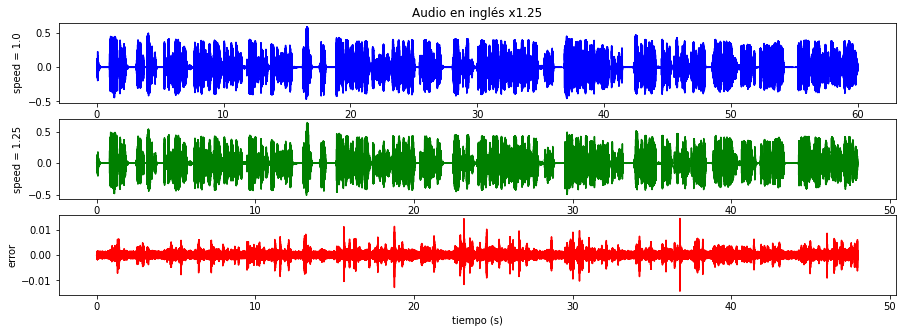

In [148]:
speed = 1.
audio_final, psola_err, err, audio_original = speed_up(audio, speed, fs)
plot_three_signals(audio_original,audio_final,psola_err, speed,normalize = False, fill_with_zeros=False)
Audio(data=audio_final, rate=fs)

## Vamos a hacer LPC short time 

In [0]:
def LPC_short_time_filter(audio_f,window_size, apply_hamming = True):
    leap = window_size // 2
    lpc_coeffs = []
    cnt_leaps = len(audio_f) // leap 
    error = np.zeros(len(audio_f))

    for i in range(cnt_leaps):
        curr_rw = audio_f[i*leap : (i+1)*leap+leap] # overlap de 50%
        if apply_hamming:
            hamming_w = np.hamming(len(curr_rw))
            curr_rw *= hamming_w
        a = librosa.lpc(curr_rw, 12)
        lpc_coeffs.append(a)
        error[i*leap : (i+1)*leap+leap] += scipy.signal.lfilter(a, [1], curr_rw)
    
    return error, lpc_coeffs

def LPC_short_time_defilter(psola_err, speed, lpc_coeffs, window_size, apply_hamming = True):
    leap = window_size // 2
    cnt_leaps = len(psola_err) // leap 
    final_audio = np.zeros(len(psola_err))
    num, den = speed.as_integer_ratio() # 3 / 2 = > num 3 , den 2 ;  4 1 

    new_lpc_coeffs = []
    for i in range(len(lpc_coeffs)):
        if den> i%num:
            new_lpc_coeffs.append(lpc_coeffs[i])

    for i in range(cnt_leaps):
        curr_rw = psola_err[i*leap : (i+1)*leap+leap] # overlap de 50%
        if apply_hamming:
            hamming_w = np.hamming(len(curr_rw))
            curr_rw *= hamming_w
        final_audio[i*leap : (i+1)*leap+leap] += scipy.signal.lfilter([1], new_lpc_coeffs[i], curr_rw)
    return final_audio

periodicidad minima que se puede estimar 100.0 Hz


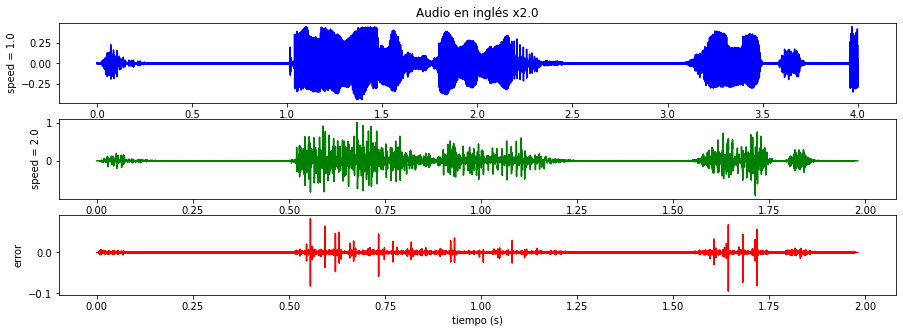

In [143]:
# este SpeedUp agrega ruido a la senial para obtener LPC
# y despues filtra la senial + ruido,
# POSIBLES MEJORAS: 
# 1) se podria filtrar solo  la senial en vez de senial mas ruido pero quedarse
# de todas formas con los coeficientes lpc esos.

def speed_up_with_LPC_ST(audio_path, speed, sample_rate, T=20*1e-3):
    audio_f, audio_i = get_float_and_int_audio(audio_path,fs, cut_audio = 4) # audio_i lo necesita el VAD
    audio_f = get_noise_for_lpc(audio_f, std=1e-3)

    K , L = get_K_and_L(T,fs)

    speech, not_speech, is_voiced, frame_len = vad_config(audio_i, fs)
    
    regions = separate_regions(is_voiced)
    regions_lpc = regions.copy()

    window_size = int(25e-3*fs)
    error, lpc_coeffs = LPC_short_time_filter(audio_f,window_size, apply_hamming = False)
    
    percent = 0.5
    psola_error, f0_idx, f0 =  process_error(error, K, L, fs,percent,speed,is_voiced,regions)

    voiced_filt =  LPC_short_time_defilter(psola_error, speed, lpc_coeffs, window_size, apply_hamming = True)

    return voiced_filt, psola_error, error, audio_f 

speed = 2.0
audio_final, psola_err, err, audio_original = speed_up_with_LPC_ST(audio, speed, fs)
plot_three_signals(audio_original,audio_final,psola_err, speed,normalize = False, fill_with_zeros=False)
Audio(data=audio_final, rate=fs)

## Conclusiones hasta ahora

* Filtrado LPC provoca picos extraños en la señal 

* Filtrado LPC SHORT TIME no mejora respecto al que propusimos que era por separacion de regiones sonoras (LPC SHORT TIME toma ventanas)

Como se hizo LPC SHORT TIME:

Filtrado:

Agarre una ventana rectangular, la filtre con el error de prediccion y eso lo puse como error cada 20ms y con overlap de 50%.

Defiltrado del error de psola:

Ventanee con hamming overlap de 50%, la filtre con el inverso del filtro de error de prediccion.

*  Bug de volumen en PSOLA

## Conclusiones hasta ahora 2 
filtrado LPC provocaba picos extraños en la señal y además introducía un cambio en el volumen.

Para solucionar esto, añadimos un parámetro de regularización por medio de añadir ruido blanco al audio, regulando la varianza pudimos mejorar esta condición de LPC. 

## Conclusiones hasta ahora 3
habia un bug en regions